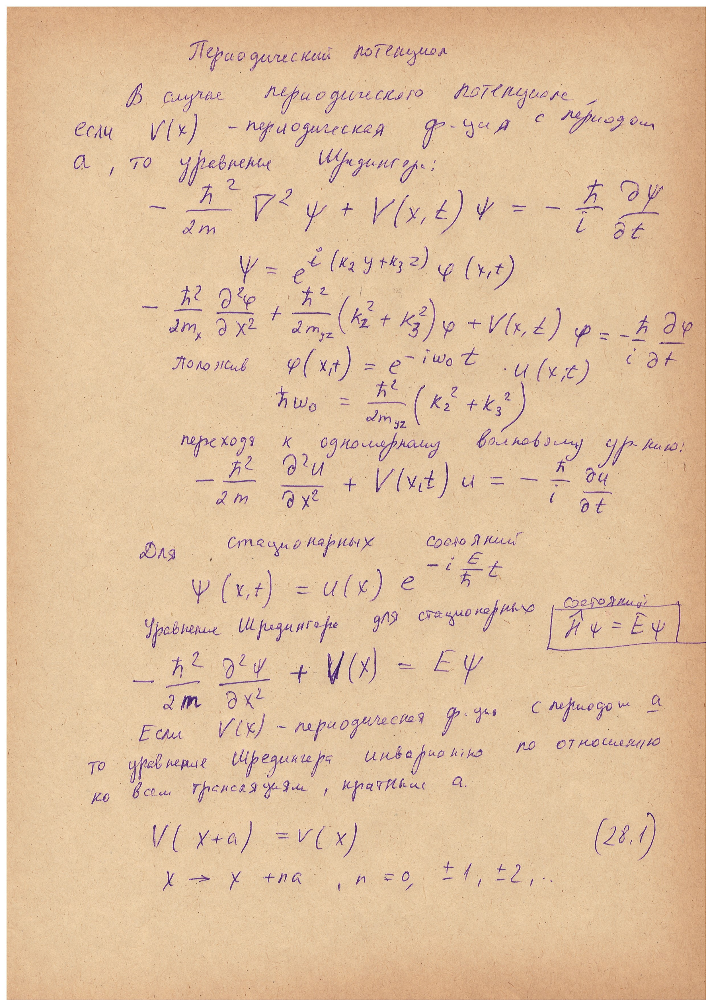

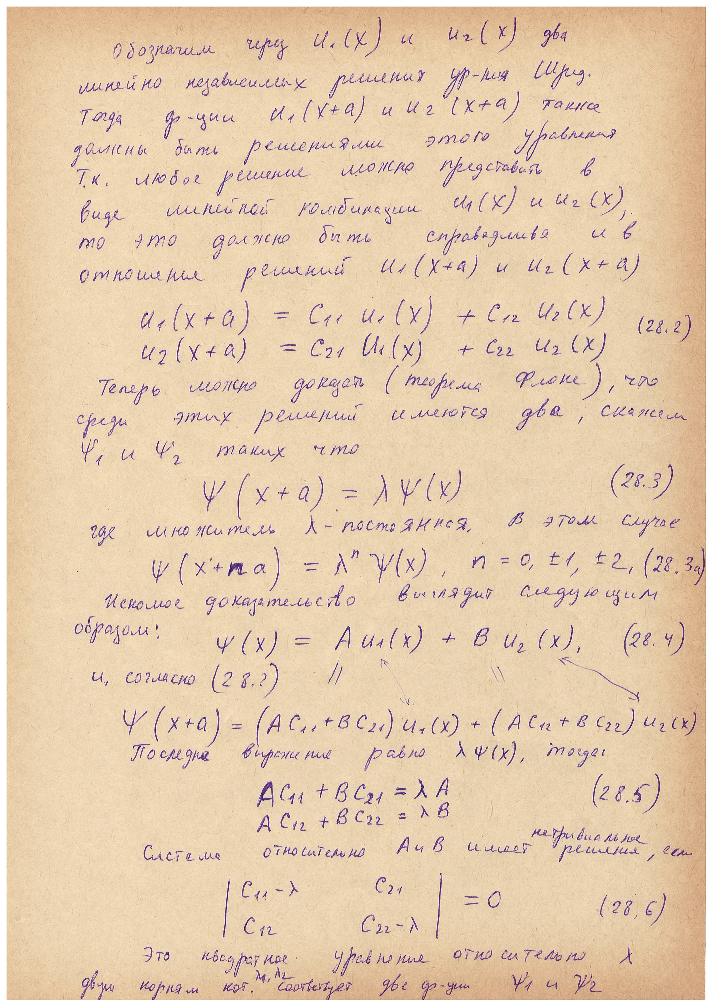

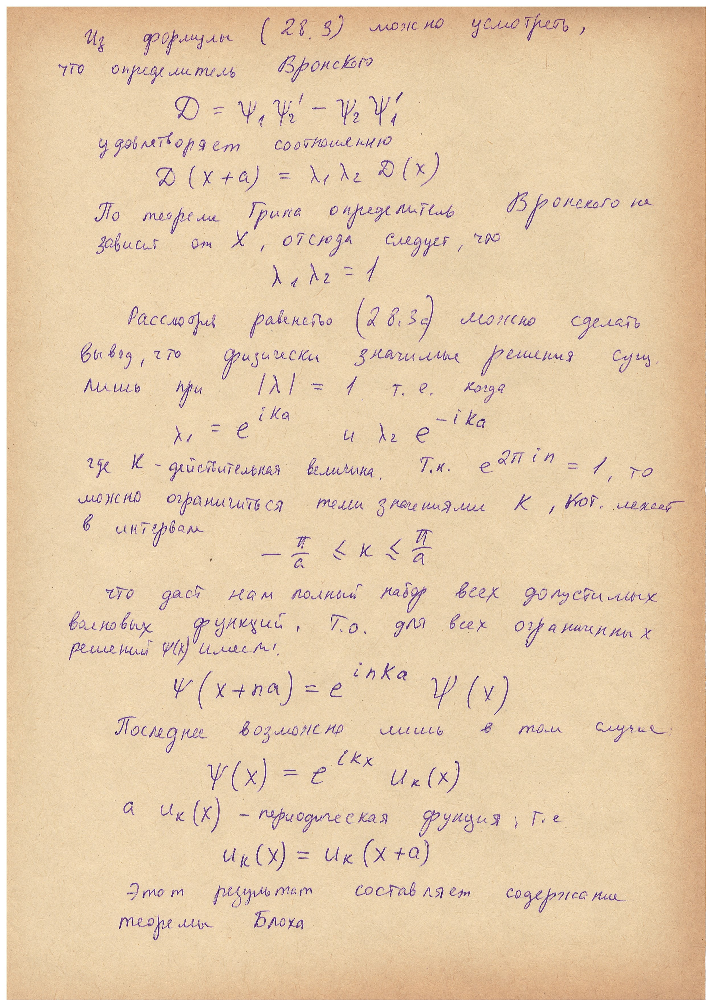

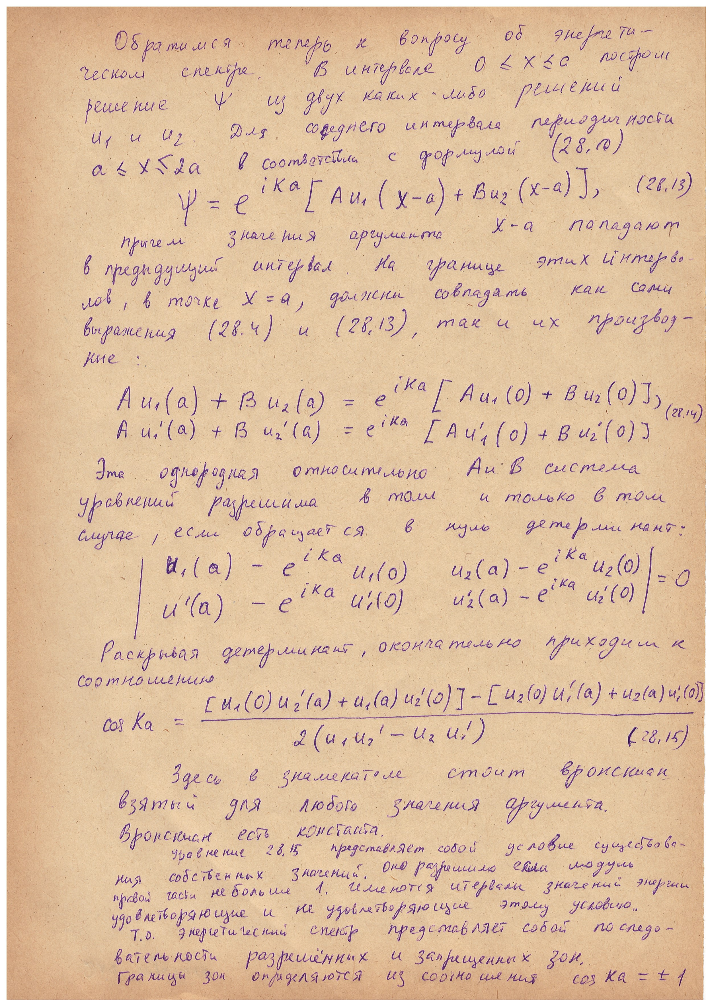

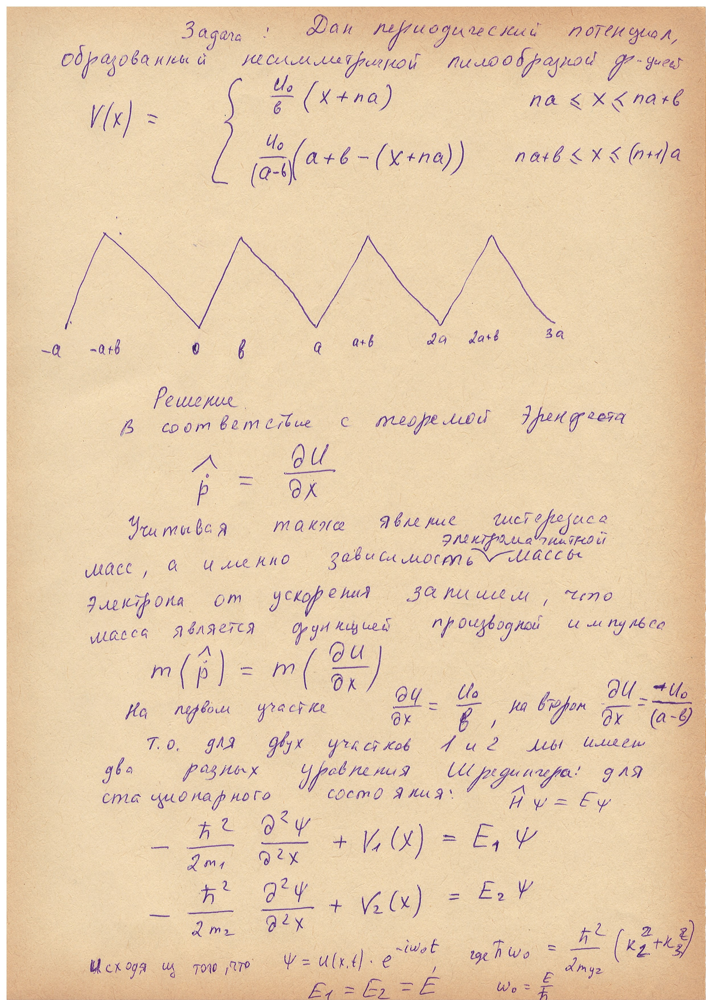

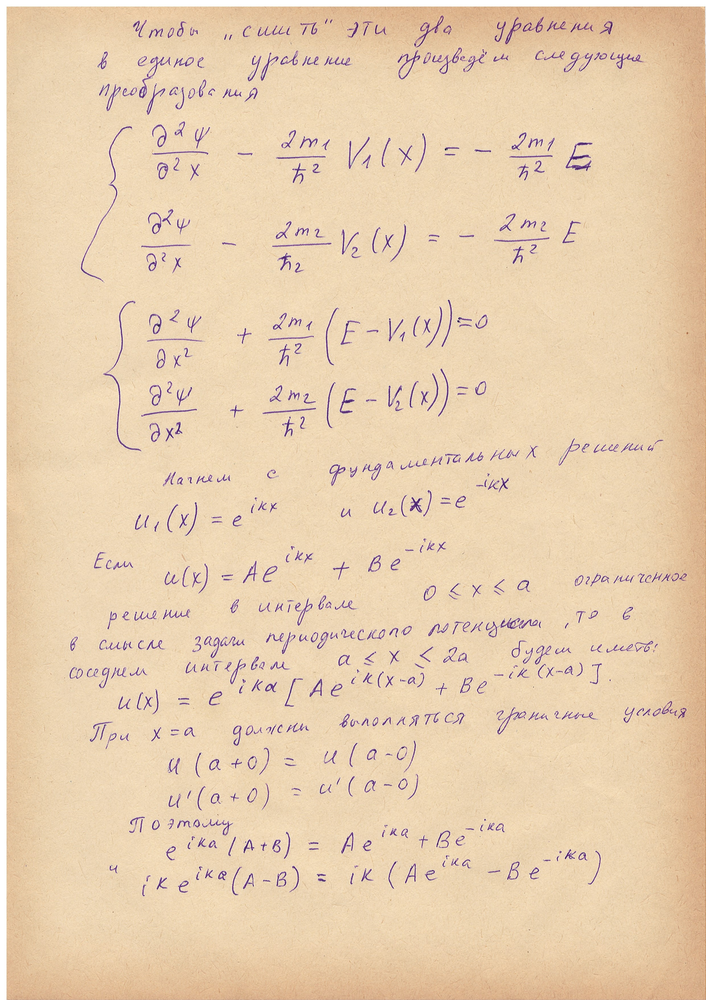

In [1]:
from IPython.display import display, Math, Latex

def disp(ex):
    display(Math(latex(ex)))
    
def displ(tex):
    display(Math(tex))

In [2]:
var("x, m_1, m_2, E, h, U_0, a, b, n, K, A, B, C, D, _K1, _K2, _C0, _C1, k, kappa, k_0")
u=function('u')(x)

In [3]:
U_1(x,n) = U_0/b     * (x-n*a)
U_2(x,n) = U_0/(a-b) * (a-(x-n*a))

In [4]:
_a = 5
_b = 1
values = [U_0 == 10, b == _b, a == _a]

In [5]:
plt = Graphics()
for _n in range(-1,2):
    plt += plot(U_1(x, n = _n).subs(values), x, _n*_a, _n*_a+_b)
    plt += plot(U_2(x, n = _n).subs(values), x, _n*_a+_b, (_n+1)*_a)

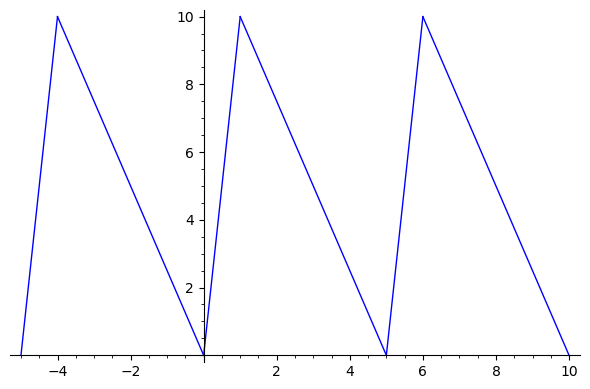

In [6]:
plt.show()

Уравнение Шредингера на интервале от $0$ до $b$

$\frac {\partial^2 u}{\partial x^2} + \frac{2 m_1}{\hbar^2} \left(E - U_1(x)\right)u = 0$

In [7]:
eq_0b(n) = diff(u,x,2) + 2*m_1/h^2 * (E - U_1(x,n)) * u == 0
disp(eq_0b(n))

<IPython.core.display.Math object>

Уравнение Шредингера на интервале от $b$ до $a$

$\frac {\partial^2 u}{\partial x^2} + \frac{2 m_2}{\hbar^2} \left(E - U_2(x)\right)u = 0$

In [8]:
eq_ba(n) = diff(u,x,2) + 2*m_2/h^2 * (E - U_2(x,n)) * u == 0
disp(eq_ba(n))

<IPython.core.display.Math object>

Решение уравнения Шредингера на интервале от $0$ до $b$ при $n \neq 0$

In [9]:
u_0b(x, n) = exp(I*n*K*a) * (A * exp(I*k*(x-n*a)) + B*exp(-I*k*(x-n*a)))
disp(u_0b(x, n))

<IPython.core.display.Math object>

Решение уравнения Шредингера на интервале от $0$ до $b$ при $n = 0$

In [10]:
disp(u_0b(x, n=0))

<IPython.core.display.Math object>

Подставляем решение на интервале от $0$ до $b$ при $n \neq 0$ в само уравнение

In [11]:
eq_u_0b_n = eq_0b(n).substitute_function(u == u_0b(x,n))
disp(eq_u_0b_n)

<IPython.core.display.Math object>

Подставляем решение на интервале от $0$ до $b$ при $n = 0$ в само уравнение

In [12]:
eq_u_0b = eq_0b(n=0).substitute_function(u == u_0b(x, n = 0))
disp(eq_u_0b)

<IPython.core.display.Math object>

Решение уравнения Шредингера на интервале от $b$ до $a$ при $n \neq 0$

In [13]:
u_ba(x, n) = exp(I*n*K*a) * (C * exp(I*k*(x-n*a)) + D*exp(-I*k*(x-n*a)))
disp(u_ba(x, n))

<IPython.core.display.Math object>

Решение уравнения Шредингера на интервале от $b$ до $a$ при $n=0$

In [14]:
disp(u_ba(x, n=0))

<IPython.core.display.Math object>

Подставляем решение на интервале от $b$ до $a$ при $n \neq 0$ в само уравнение

In [15]:
eq_u_ba_n = eq_ba(n).substitute_function(u == u_ba(x, n))
disp(eq_u_ba_n)

<IPython.core.display.Math object>

Подставляем решение на интервале от $b$ до $a$ при $n = 0$ в само уравнение

In [16]:
eq_u_ba = eq_ba(n=0).substitute_function(u == u_ba(x, n=0))
disp(eq_u_ba)

<IPython.core.display.Math object>

In [17]:
eq_u_0b_n0_x0 = eq_u_0b_n.subs(x == 0, n == 0)
disp(eq_u_0b_n0_x0)

<IPython.core.display.Math object>

In [18]:
eq_u_0b_n0_xb = eq_u_0b_n.subs(x == b, n == 0)
disp(eq_u_0b_n0_xb)

<IPython.core.display.Math object>

In [19]:
eq_u_ba_n0_xb = eq_u_ba_n.subs(x == b, n == 0)
disp(eq_u_ba_n0_xb)

<IPython.core.display.Math object>

In [20]:
eq_u_ba_n0_xa = eq_u_ba_n.subs(x == a, n == 0)
disp(eq_u_ba_n0_xa)

<IPython.core.display.Math object>

сшиваем оба решения в точке $b$

In [21]:
link_u_xb = u_0b(x=b, n=0) == u_ba(x=b, n=0)
disp(link_u_xb)

<IPython.core.display.Math object>

In [22]:
link_dudx_xb = u_0b(x, n=0).diff(x).subs(x == b) \
            == u_ba(x, n=0).diff(x).subs(x == b)
disp(link_dudx_xb)

<IPython.core.display.Math object>

сшиваем оба решения в точке $a$

In [23]:
link_u_xa = u_ba(x=a, n=0) == u_0b(x=a, n=1)
disp(link_u_xa)

<IPython.core.display.Math object>

In [24]:
link_dudx_xa = u_ba(x, n=0).diff(x).subs(x == a) \
            == u_0b(x, n=1).diff(x).subs(x == a)

disp(link_dudx_xa)

<IPython.core.display.Math object>

Получаем систему 4 уравнений относительно 4 неизвестных коэффициентов $A,B,C,D$.

In [25]:
sys = [link_u_xb, link_dudx_xb,
       link_u_xa, link_dudx_xa]

Данная система имеет нетривиальные решения, если ее определитель равен нулю

In [26]:
def GenerateMatrix(equsys, vars):
    A=matrix(SR, [[(equ.lhs() - equ.rhs()).coefficient(v) for v in vars] for equ in equsys])
    return A

In [27]:
vars = [A, B, C, D]

In [28]:
M = GenerateMatrix(sys, vars)

In [29]:
disp(M)

<IPython.core.display.Math object>

In [30]:
det_M = M.determinant()
disp(det_M)

<IPython.core.display.Math object>

In [31]:
eq_det_M = det_M == 0
disp(eq_det_M)

<IPython.core.display.Math object>